In [5]:
import os
import re
import shutil

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tifffile
import torch
import shapely
from shapely import Polygon, Point, STRtree
from shapely.wkt import dumps, loads
from skimage.exposure import rescale_intensity

In [6]:
%load_ext autoreload
%autoreload 2
from mip.utils import extract_ome_tiff, listfiles, display_region, make_pseudo

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.rcParams['figure.dpi'] = 120

In [8]:
directory = '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/brca_dcis_v2/region_analysis_v2'


In [9]:
fps = sorted(listfiles(directory, regex=r'.pt$'))
fps

[]

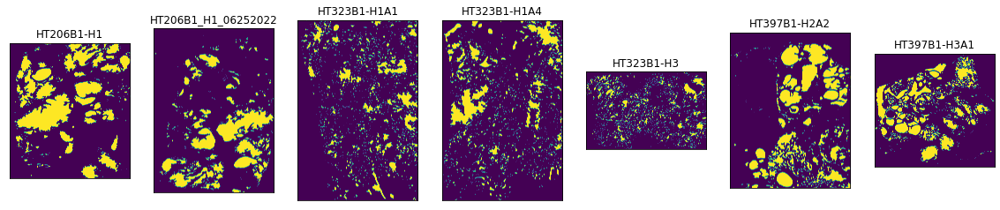

In [8]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    img = d['region']['mask']
    ax.imshow(img)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

In [9]:
region_to_bbox = {reg:(r1, c1, r2, c2) for reg, r1, c1, r2, c2 in zip(
                    combined.index.to_list(),
                    combined['boundary_bbox-0'], combined['boundary_bbox-1'],
                    combined['boundary_bbox-2'], combined['boundary_bbox-3'])}

In [146]:
def get_display_image(s, labeled, region_to_bbox, vmax=None,
                      color='region_grid_metrics_SMA_integrity', cmap='viridis', df=None):
    if df is None:
        df = combined

    f = df[df['sample']==s]
    f.index = [x.split('_')[-1] for x in f.index]
    rbbox = {reg.split('_')[-1]:tup for reg, tup in region_to_bbox.items() if s in reg}
    region_to_val = {reg:v
                     for reg, v in zip(f.index, f[color])}
    if region_to_val:
        rgba = display_region(labeled, region_to_val, rbbox, cmap=cmap, vmax=vmax)
    else:
        rgba = np.ones((labeled.shape[0], labeled.shape[1], 4))
    return rgba

In [ ]:
s = 'HT206B1-H1'
color = 'region_grid_metrics_SMA_integrity'
f = combined[combined['sample']==s]
f.index = [x.split('_')[-1] for x in f.index]
rbbox = {reg.split('_')[-1]:tup for reg, tup in region_to_bbox_thumbnail.items() if s in reg}
region_to_val = {reg:v
                 for reg, v in zip(f.index, f[color])}
rgba = display_region(sample_to_imgs[s]['region']['labeled_thumbnail'],
                      region_to_val, rbbox, cmap='viridis', vmax=.1)

In [11]:
from skimage.transform import rescale, resize

In [12]:
# make thumbnails so it doesn't take so long to plot
for s in sample_to_imgs.keys():
    print(s)
    for name in sample_to_imgs[s].keys():
        for k in list(sample_to_imgs[s][name].keys()):
            if name=='region':
                img = sample_to_imgs[s][name][k]
                rescaled = rescale(img, .1, preserve_range=True).round().astype(np.int32)
                sample_to_imgs[s][name][f'{k}_thumbnail'] = rescaled


HT206B1-H1
HT206B1_H1_06252022
HT323B1-H1A1
HT323B1-H1A4
HT323B1-H3
HT397B1-H2A2
HT397B1-H3A1


In [13]:
sample_to_imgs['HT206B1-H1']['region'].keys()

dict_keys(['labeled', 'mask', 'labeled_thumbnail', 'mask_thumbnail'])

In [14]:
region_to_bbox_thumbnail = {k:(int(r1 * .1), int(c1 * .1), int(r2 * .1), int(c2 * .1))
                           for k, (r1, c1, r2, c2) in region_to_bbox.items()}

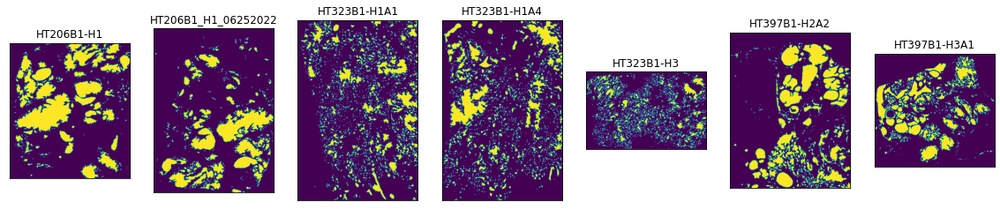

In [15]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    labeled = sample_to_imgs[s]['region']['labeled_thumbnail']
    ax.imshow(labeled>0)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

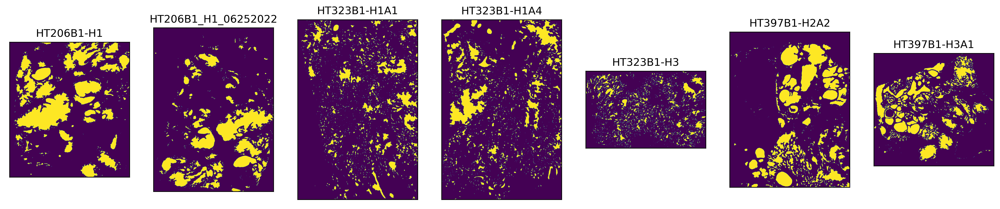

In [172]:
fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
for (s, d), ax in zip(sample_to_imgs.items(), axs):
    labeled = sample_to_imgs[s]['region']['mask_thumbnail']
    ax.imshow(labeled>0)
    ax.set_title(s)
    ax.set_xticks([])
    ax.set_yticks([])

In [ ]:
display_region(sample_to_imgs[s]['region']['mask_thumbnail'])

dict_keys(['labeled', 'mask', 'labeled_thumbnail', 'mask_thumbnail'])


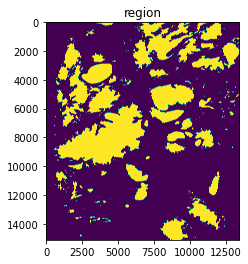

dict_keys(['labeled', 'mask'])


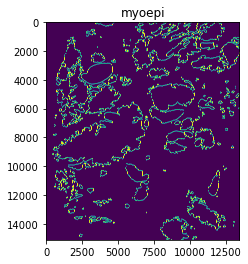

dict_keys(['labeled', 'mask'])


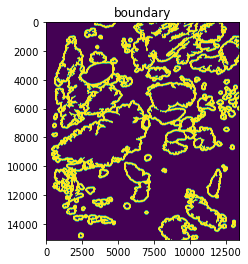

dict_keys(['labeled', 'mask'])


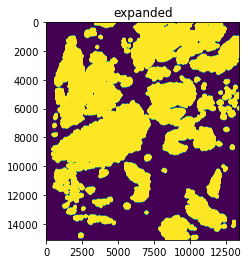

In [35]:
img = next(iter(sample_to_imgs.values()))
for k, d in img.items():
    print(d.keys())
    plt.imshow(d['mask'])
    plt.title(k)
    plt.show()

In [32]:
img['region']['mask_thumbnail']

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int32)

In [16]:
prob_df = pd.read_csv(
    '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/dcis_region_analysis/classifier_v1/results/probs.txt',
    sep='\t', index_col=0)
cols = prob_df.columns
prob_df.columns = [f'prob_{c}' for c in prob_df.columns]
prob_df['predicted_label'] = [cols[i] for i in np.argmax(prob_df.values, axis=-1)]
prob_df

,prob_dcis,prob_idc,prob_normal,predicted_label
region_id,,,,
HT397B1-H3A1_516,0.000235,0.000154,0.999610,normal
HT206B1-H1_85,0.000054,0.999938,0.000008,idc
HT323B1-H1A4_1341,0.008480,0.988422,0.003098,idc
HT323B1-H1A4_938,0.000278,0.000183,0.999539,normal
HT323B1-H1A1_803,0.050103,0.935101,0.014795,idc
...,...,...,...,...
HT206B1_H1_06252022_317,0.001995,0.997492,0.000512,idc
HT323B1-H1A1_1781,0.003362,0.995733,0.000905,idc
HT323B1-H1A1_1585,0.052838,0.041085,0.906077,normal


In [17]:
combined = combined[[c for c in combined.columns if c not in ['prob_dcis', 'prob_idc', 'prob_normal', 'predicted_label']]]
combined = pd.merge(combined, prob_df, left_index=True, right_index=True, how='left')
combined

,boundary_area,boundary_bbox-0,boundary_bbox-1,boundary_bbox-2,boundary_bbox-3,boundary_cell_type_CD4 T cell_cell_fraction,boundary_cell_type_CD8 T cell_cell_fraction,boundary_cell_type_Endothelial_cell_fraction,boundary_cell_type_Fibroblast_cell_fraction,boundary_cell_type_Macrophage - M1_cell_fraction,...,region_metacluster_Tumor Boundary - Stroma Enriched 1_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 2_cell_fraction,region_metacluster_Tumor_cell_fraction,region_perimeter,region_voronoi_entropy,sample,prob_dcis,prob_idc,prob_normal,predicted_label
HT206B1-H1_1,288848,0,3292,428,4858,0.000000,0.018519,0.018519,0.129630,0.018519,...,0.000000,0.000000,0.996296,2983.010460,1.422960,HT206B1-H1,7.027152e-03,0.990834,2.138557e-03,idc
HT206B1-H1_2,3584904,0,5869,3535,10328,0.044394,0.057562,0.096689,0.257336,0.118886,...,0.024992,0.013660,0.952189,41180.726733,1.544055,HT206B1-H1,9.232326e-07,0.999999,8.276145e-08,idc
HT206B1-H1_3,294295,0,10215,922,11262,0.042254,0.000000,0.103286,0.333333,0.140845,...,0.027778,0.009259,0.953704,3535.511252,1.452809,HT206B1-H1,1.381439e-04,0.999838,2.393602e-05,idc
HT206B1-H1_4,35898,0,11124,174,11449,0.000000,0.000000,0.052632,0.315789,0.210526,...,0.285714,0.428571,0.142857,318.509668,0.000000,HT206B1-H1,4.453982e-02,0.434310,5.211499e-01,normal
HT206B1-H1_5,646084,0,10536,1373,12334,0.044118,0.026961,0.068627,0.223039,0.122549,...,0.009608,0.011209,0.977582,7239.408327,1.538911,HT206B1-H1,1.346348e-04,0.999849,1.599994e-05,idc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-H3A1_807,34432,19286,8942,19515,9160,0.428571,0.267857,0.000000,0.071429,0.053571,...,0.000000,0.000000,0.000000,30.142136,NaN,HT397B1-H3A1,5.887796e-04,0.999287,1.245038e-04,idc
HT397B1-H3A1_808,100067,19336,11047,19698,11420,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,198.877200,NaN,HT397B1-H3A1,2.876195e-03,0.996355,7.683965e-04,idc
HT397B1-H3A1_809,78991,19796,2050,20113,2371,0.000000,0.000000,0.222222,0.222222,0.000000,...,0.000000,0.000000,0.000000,56.769553,NaN,HT397B1-H3A1,1.204924e-03,0.998515,2.801900e-04,idc
HT397B1-H3A1_810,74758,19859,10591,20160,10903,0.000000,0.000000,0.200000,0.200000,0.000000,...,0.000000,0.000000,0.000000,33.112698,NaN,HT397B1-H3A1,1.090312e-03,0.998660,2.501746e-04,idc


In [18]:
combined['predicted_label'] = ['unclassified' if pd.isnull(x) else x for x in combined['predicted_label']]

In [175]:
def display_legend(cmap, n=50):
    fig, axs = plt.subplots(nrows=1, ncols=len(cmap))
    for i, (name, c) in enumerate(cmap.items()):
        ax = axs[i]
        rect = np.zeros((n, n, 3), dtype=np.float32)
        print(c)
        rect[:, :] = c
        ax.imshow(rect)
        ax.set_title(name)
        ax.set_xticks([])
        ax.set_yticks([])
def show_regions(df, feat, cmap=None, vmax=None):
    fig, axs = plt.subplots(nrows=1, ncols=len(sample_to_imgs), figsize=(20, 10))
    for (s, d), ax in zip(sample_to_imgs.items(), axs):
        labeled = sample_to_imgs[s]['region']['labeled_thumbnail']
        
        if feat is not None:
            img = get_display_image(s, labeled, region_to_bbox_thumbnail, color=feat, df=df, cmap=cmap)
        else:
            img = get_display_image(s, labeled, region_to_bbox_thumbnail, color='region_area', df=df, cmap=cmap)
            img = img[:, :, -1] > 0
        ax.imshow(img)
        ax.set_title(s)
        ax.set_xticks([])
        ax.set_yticks([])   
    

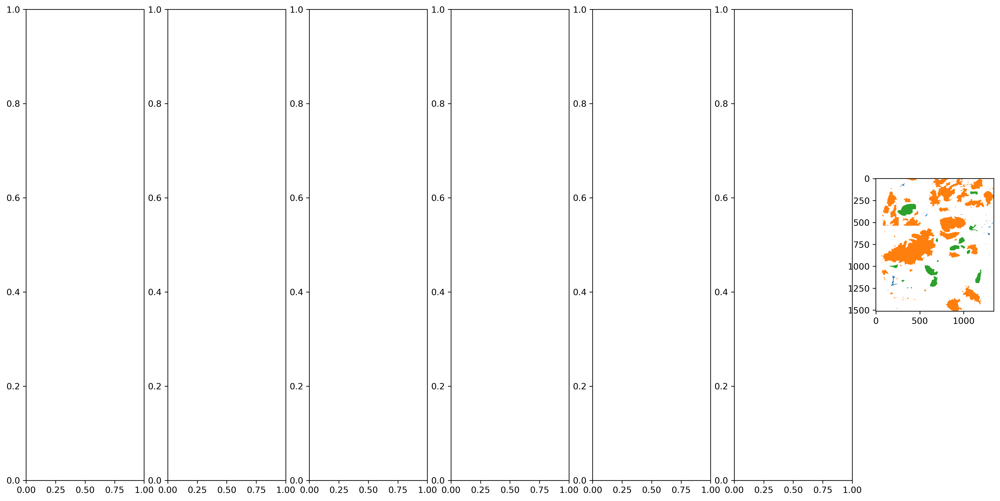

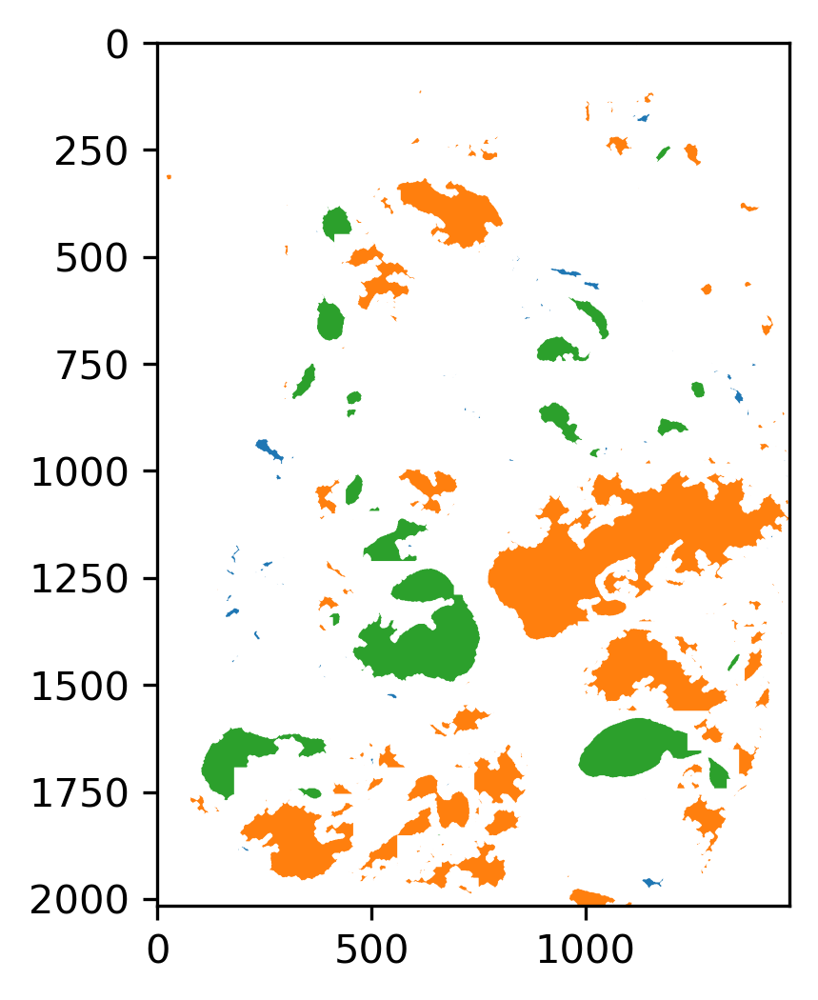

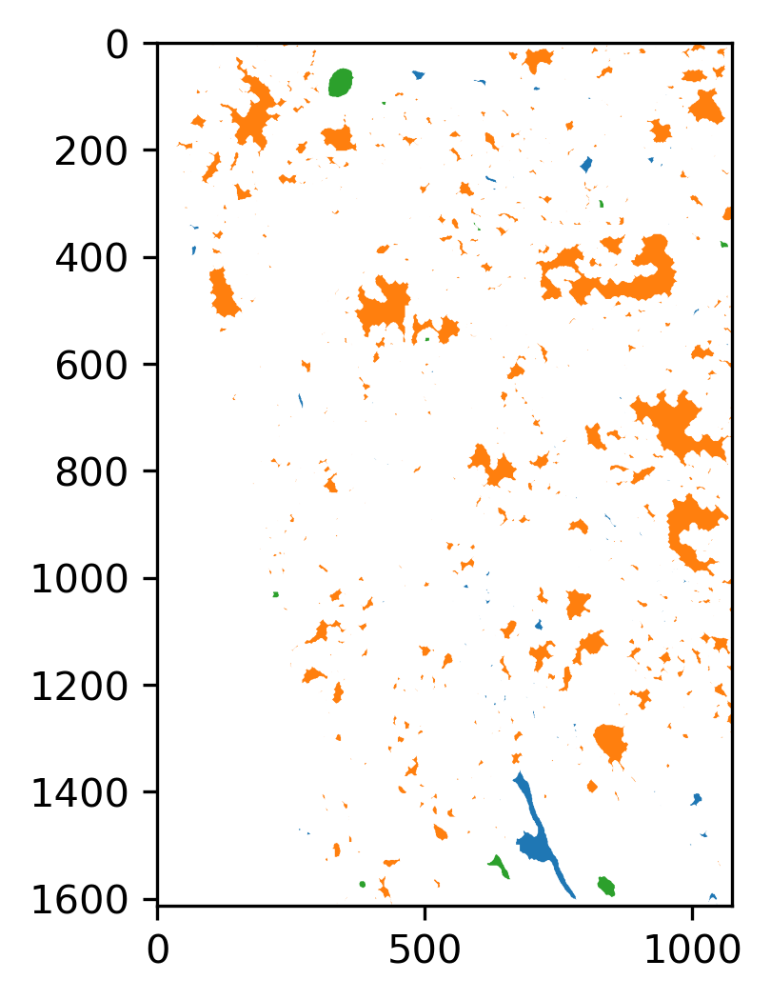

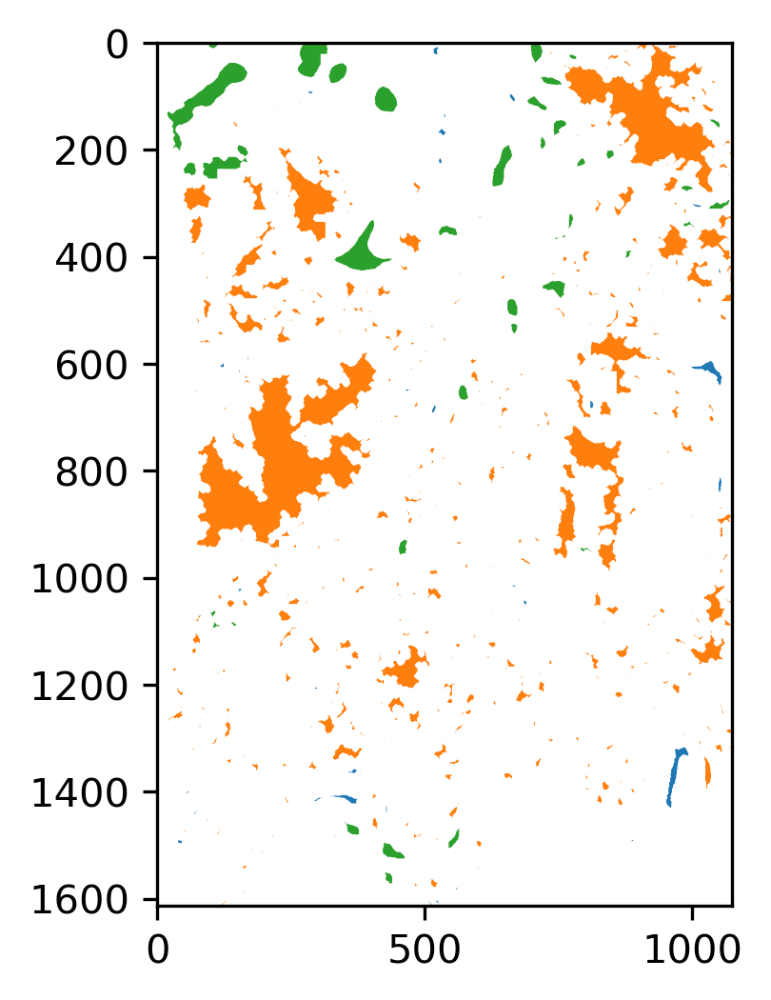

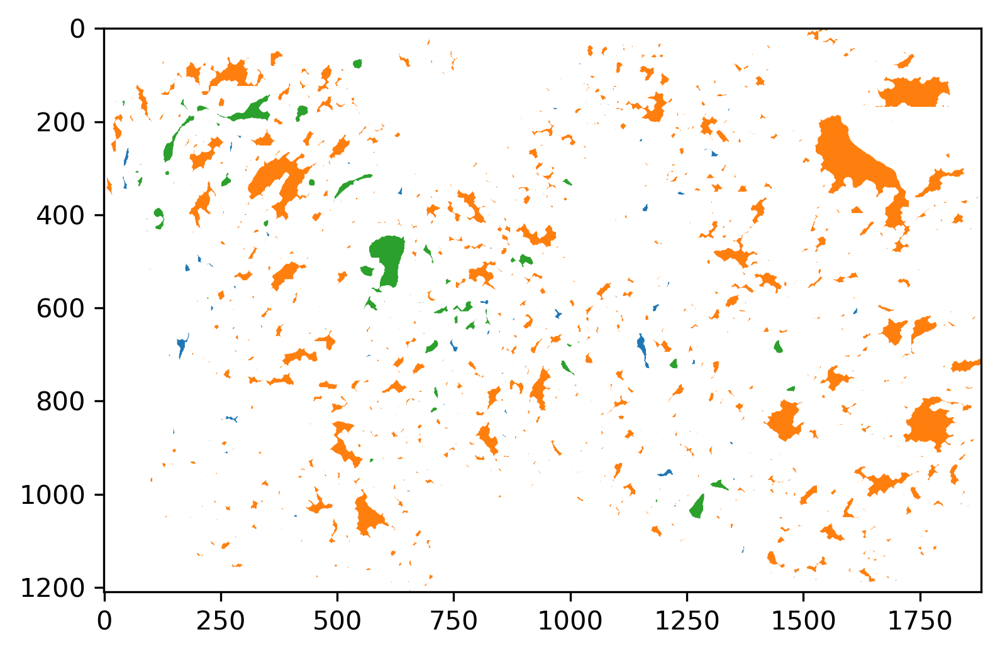

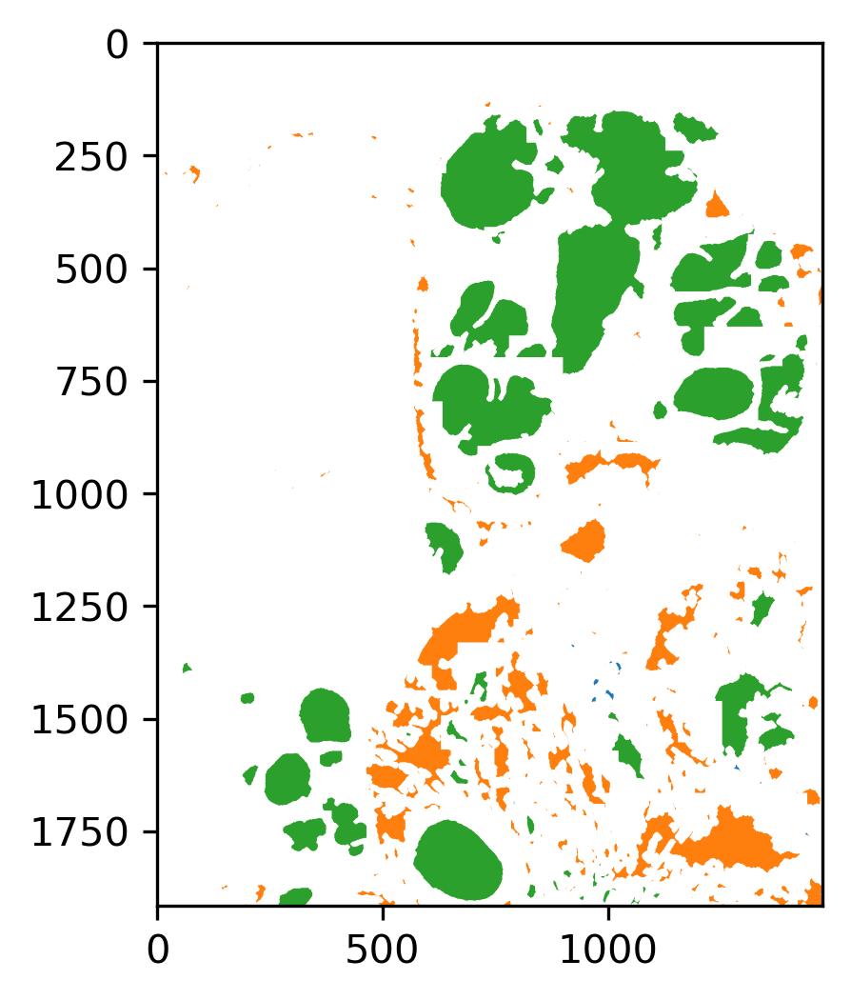

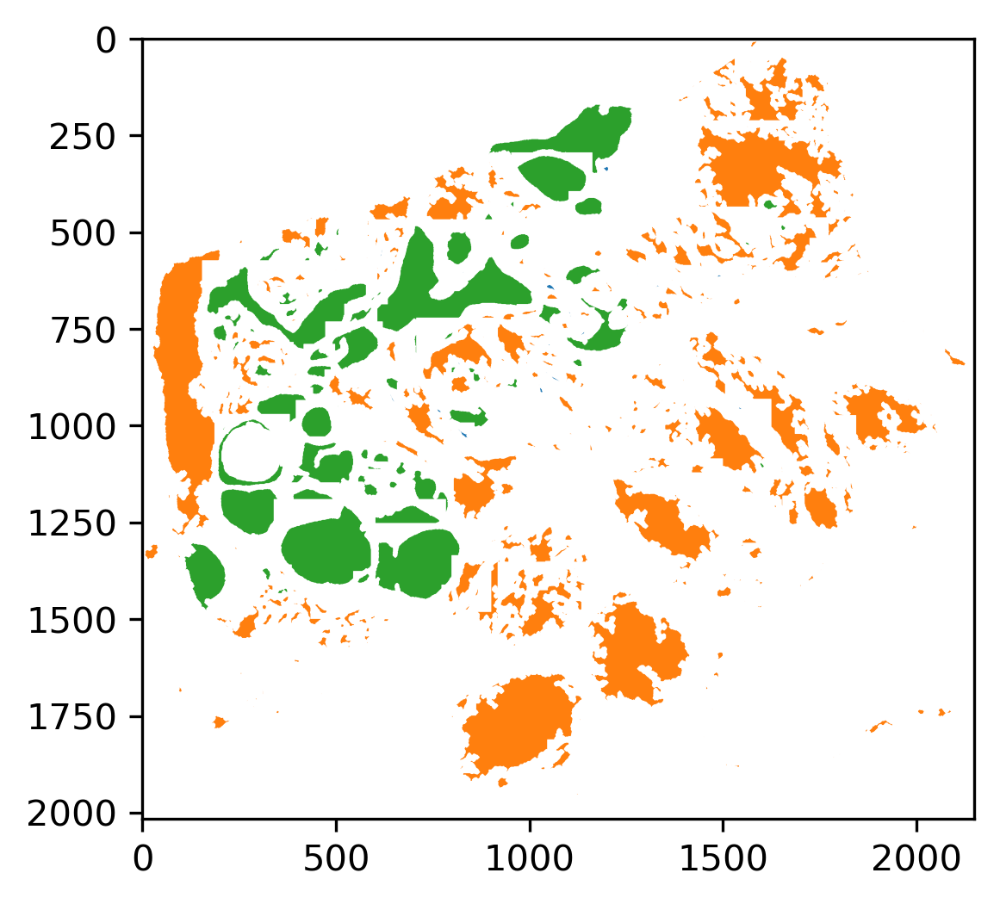

In [176]:
import seaborn as sns
cmap = {x:c for c, x in zip(sns.color_palette('tab10'), set(combined['predicted_label']))}
show_regions(combined, 'predicted_label', cmap=cmap)

(0.12156862745098039, 0.4666666666666667, 0.7058823529411765)
(1.0, 0.4980392156862745, 0.054901960784313725)
(0.17254901960784313, 0.6274509803921569, 0.17254901960784313)
(0.8392156862745098, 0.15294117647058825, 0.1568627450980392)


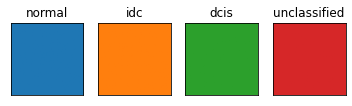

In [24]:
display_legend(cmap)

In [26]:
import scanpy as sc

In [25]:
fps = sorted(listfiles(f'../../multiplex_data/analysis/brca_dcis_v1/metaclustered/', regex=r'.h5ad'))
fps

['../../multiplex_data/analysis/brca_dcis_v1/metaclustered/HT206B1-H1.h5ad',
 '../../multiplex_data/analysis/brca_dcis_v1/metaclustered/HT206B1_H1_06252022.h5ad',
 '../../multiplex_data/analysis/brca_dcis_v1/metaclustered/HT323B1-H1A1.h5ad',
 '../../multiplex_data/analysis/brca_dcis_v1/metaclustered/HT323B1-H1A4.h5ad',
 '../../multiplex_data/analysis/brca_dcis_v1/metaclustered/HT323B1-H3.h5ad',
 '../../multiplex_data/analysis/brca_dcis_v1/metaclustered/HT397B1-H2A2.h5ad',
 '../../multiplex_data/analysis/brca_dcis_v1/metaclustered/HT397B1-H3A1.h5ad']

In [36]:
sid_to_adata = {}
for fp in fps:
    sid = fp.split('/')[-1].split('.')[0]
    sid_to_adata[sid] = sc.read_h5ad(fp)
sid_to_adata.keys()

dict_keys(['HT206B1-H1', 'HT206B1_H1_06252022', 'HT323B1-H1A1', 'HT323B1-H1A4', 'HT323B1-H3', 'HT397B1-H2A2', 'HT397B1-H3A1'])

In [37]:
combined

,boundary_area,boundary_bbox-0,boundary_bbox-1,boundary_bbox-2,boundary_bbox-3,boundary_cell_type_CD4 T cell_cell_fraction,boundary_cell_type_CD8 T cell_cell_fraction,boundary_cell_type_Endothelial_cell_fraction,boundary_cell_type_Fibroblast_cell_fraction,boundary_cell_type_Macrophage - M1_cell_fraction,...,region_metacluster_Tumor Boundary - Stroma Enriched 1_cell_fraction,region_metacluster_Tumor Boundary - Stroma Enriched 2_cell_fraction,region_metacluster_Tumor_cell_fraction,region_perimeter,region_voronoi_entropy,sample,prob_dcis,prob_idc,prob_normal,predicted_label
HT206B1-H1_1,288848,0,3292,428,4858,0.000000,0.018519,0.018519,0.129630,0.018519,...,0.000000,0.000000,0.996296,2983.010460,1.422960,HT206B1-H1,7.027152e-03,0.990834,2.138557e-03,idc
HT206B1-H1_2,3584904,0,5869,3535,10328,0.044394,0.057562,0.096689,0.257336,0.118886,...,0.024992,0.013660,0.952189,41180.726733,1.544055,HT206B1-H1,9.232326e-07,0.999999,8.276145e-08,idc
HT206B1-H1_3,294295,0,10215,922,11262,0.042254,0.000000,0.103286,0.333333,0.140845,...,0.027778,0.009259,0.953704,3535.511252,1.452809,HT206B1-H1,1.381439e-04,0.999838,2.393602e-05,idc
HT206B1-H1_4,35898,0,11124,174,11449,0.000000,0.000000,0.052632,0.315789,0.210526,...,0.285714,0.428571,0.142857,318.509668,0.000000,HT206B1-H1,4.453982e-02,0.434310,5.211499e-01,normal
HT206B1-H1_5,646084,0,10536,1373,12334,0.044118,0.026961,0.068627,0.223039,0.122549,...,0.009608,0.011209,0.977582,7239.408327,1.538911,HT206B1-H1,1.346348e-04,0.999849,1.599994e-05,idc
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
HT397B1-H3A1_807,34432,19286,8942,19515,9160,0.428571,0.267857,0.000000,0.071429,0.053571,...,0.000000,0.000000,0.000000,30.142136,NaN,HT397B1-H3A1,5.887796e-04,0.999287,1.245038e-04,idc
HT397B1-H3A1_808,100067,19336,11047,19698,11420,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,198.877200,NaN,HT397B1-H3A1,2.876195e-03,0.996355,7.683965e-04,idc
HT397B1-H3A1_809,78991,19796,2050,20113,2371,0.000000,0.000000,0.222222,0.222222,0.000000,...,0.000000,0.000000,0.000000,56.769553,NaN,HT397B1-H3A1,1.204924e-03,0.998515,2.801900e-04,idc
HT397B1-H3A1_810,74758,19859,10591,20160,10903,0.000000,0.000000,0.200000,0.200000,0.000000,...,0.000000,0.000000,0.000000,33.112698,NaN,HT397B1-H3A1,1.090312e-03,0.998660,2.501746e-04,idc


In [76]:
cols = ['sample']
cols += [c for c in combined.columns
         if 'boundary_cell_type' in c
         if 'Noise' not in c]
short = combined[cols]
short.columns = [x.replace('boundary_cell_type_', '').replace('_cell_fraction', '') for x in short.columns]
short.sort_values(['Tumor', 'Fibroblast'])
short

,sample,CD4 T cell,CD8 T cell,Endothelial,Fibroblast,Macrophage - M1,Macrophage - M2,Myoepithelial,Tumor
HT206B1-H1_1,HT206B1-H1,0.000000,0.018519,0.018519,0.129630,0.018519,0.037037,0.000000,0.740741
HT206B1-H1_2,HT206B1-H1,0.044394,0.057562,0.096689,0.257336,0.118886,0.030098,0.019940,0.355530
HT206B1-H1_3,HT206B1-H1,0.042254,0.000000,0.103286,0.333333,0.140845,0.023474,0.009390,0.328638
HT206B1-H1_4,HT206B1-H1,0.000000,0.000000,0.052632,0.315789,0.210526,0.000000,0.000000,0.315789
HT206B1-H1_5,HT206B1-H1,0.044118,0.026961,0.068627,0.223039,0.122549,0.024510,0.004902,0.470588
...,...,...,...,...,...,...,...,...,...
HT397B1-H3A1_807,HT397B1-H3A1,0.428571,0.267857,0.000000,0.071429,0.053571,0.000000,0.000000,0.160714
HT397B1-H3A1_808,HT397B1-H3A1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
HT397B1-H3A1_809,HT397B1-H3A1,0.000000,0.000000,0.222222,0.222222,0.000000,0.000000,0.000000,0.444444
HT397B1-H3A1_810,HT397B1-H3A1,0.000000,0.000000,0.200000,0.200000,0.000000,0.000000,0.000000,0.400000


In [135]:
charts = []
for sid in samples:
    print(sid)
    f = short[short['sample']==sid]
    f = f[[c for c in f.columns if c != 'sample']]
    f = f / np.expand_dims(f.sum(axis=1).to_numpy(), -1)
    f = f.dropna(axis=0)
    
    xs = f[['Tumor', 'Fibroblast', 'Endothelial', 'Myoepithelial']].sum(axis=1).to_numpy()
    idxs = np.argsort(xs)
    idxs = np.random.choice(idxs, size=min(500, len(idxs)), replace=False)
    f = f.iloc[idxs]
    
    xs = f[['Tumor', 'Fibroblast', 'Endothelial', 'Myoepithelial']].sum(axis=1).to_numpy()
    idxs = np.argsort(xs)
    f = f.iloc[idxs]
    order = f.index.to_list()
    
    f = f.melt(ignore_index=False)
    f['region'] = f.index.to_list()
    print(f.shape)
    chart = alt.Chart(f).mark_bar().encode(
        x=alt.X('region', sort=order),
        y='value',
        color='variable'
    )
    
    charts.append(chart)

HT206B1-H1
(2824, 3)
HT206B1_H1_06252022
(4000, 3)
HT323B1-H1A1
(4000, 3)
HT323B1-H1A4
(4000, 3)
HT323B1-H3
(4000, 3)
HT397B1-H2A2
(4000, 3)
HT397B1-H3A1
(4000, 3)


In [137]:
alt.vconcat(*charts)

alt.VConcatChart(...)

In [150]:
list(combined.columns)

['boundary_area',
 'boundary_bbox-0',
 'boundary_bbox-1',
 'boundary_bbox-2',
 'boundary_bbox-3',
 'boundary_cell_type_CD4 T cell_cell_fraction',
 'boundary_cell_type_CD8 T cell_cell_fraction',
 'boundary_cell_type_Endothelial_cell_fraction',
 'boundary_cell_type_Fibroblast_cell_fraction',
 'boundary_cell_type_Macrophage - M1_cell_fraction',
 'boundary_cell_type_Macrophage - M2_cell_fraction',
 'boundary_cell_type_Myoepithelial_cell_fraction',
 'boundary_cell_type_Noise_cell_fraction',
 'boundary_cell_type_Tumor_cell_fraction',
 'boundary_centroid-0',
 'boundary_centroid-1',
 'boundary_compactness',
 'boundary_eccentricity',
 'boundary_extent',
 'boundary_intensity_overlap_E-cadherin_Ki67',
 'boundary_intensity_overlap_E-cadherin_MGP',
 'boundary_intensity_overlap_E-cadherin_Pan-CK',
 'boundary_intensity_overlap_E-cadherin_Podoplanin',
 'boundary_intensity_overlap_E-cadherin_SMA',
 'boundary_intensity_overlap_Ki67_MGP',
 'boundary_intensity_overlap_Ki67_Pan-CK',
 'boundary_intensity_ov

In [160]:
cols = [
    'boundary_cell_type_CD4 T cell_cell_fraction',
    'boundary_cell_type_CD8 T cell_cell_fraction',
    'boundary_cell_type_Macrophage - M1_cell_fraction',
    'boundary_cell_type_Macrophage - M2_cell_fraction',
]
combined['boundary_combined_immune_fraction'] = combined[cols].sum(axis=1)
cols = [
    'region_cell_type_CD4 T cell_cell_fraction',
    'region_cell_type_CD8 T cell_cell_fraction',
    'region_cell_type_Macrophage - M1_cell_fraction',
    'region_cell_type_Macrophage - M2_cell_fraction',
]
combined['region_combined_immune_fraction'] = combined[cols].sum(axis=1)

In [163]:
fig_dir = '/diskmnt/Projects/Users/estorrs/multiplex_data/analysis/subclone_quick_analysis'
from pathlib import Path
Path(fig_dir).mkdir(parents=True, exist_ok=True)

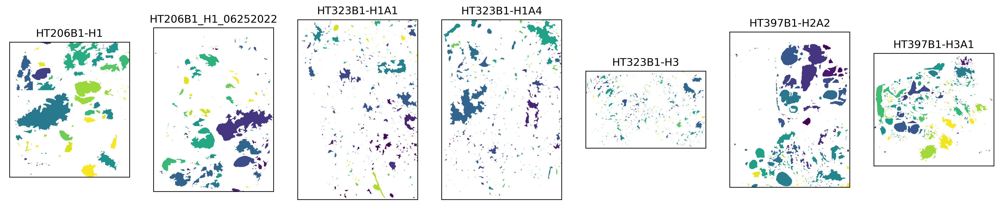

In [168]:
show_regions(combined, 'boundary_combined_immune_fraction', vmax=.4)
plt.savefig(os.path.join(fig_dir, 'boundary_combined_immune_fraction.pdf'))

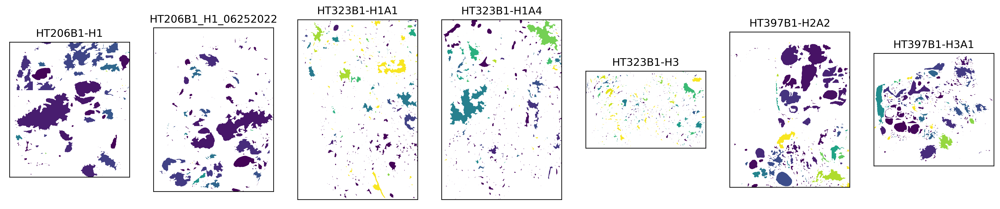

In [169]:
show_regions(combined, 'region_combined_immune_fraction', vmax=.1)
plt.savefig(os.path.join(fig_dir, 'region_combined_immune_fraction.pdf'))

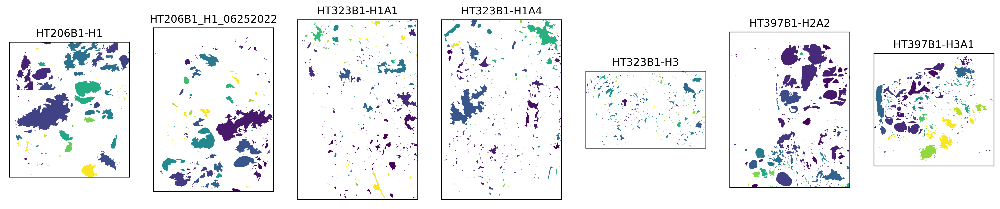

In [170]:
show_regions(combined, 'boundary_cell_type_CD8 T cell_cell_fraction', vmax=.15)
plt.savefig(os.path.join(fig_dir, 'boundary_cell_type_CD8_T_cell_cell_fraction.pdf'))

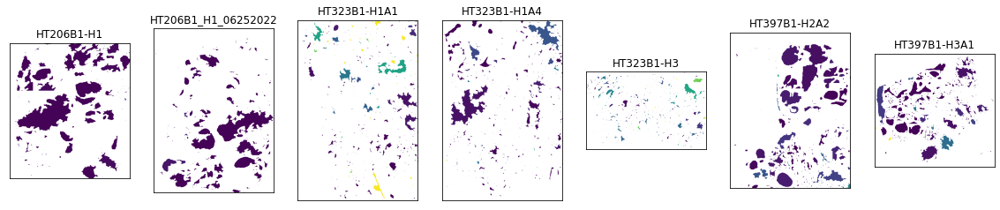

In [148]:
import seaborn as sns
show_regions(combined, 'region_cell_type_CD8 T cell_cell_fraction', vmax=.1)

(array([0, 1, 2, 3, 4, 5, 6]),
 [Text(0, 0, 'HT206B1-H1'),
  Text(1, 0, 'HT206B1_H1_06252022'),
  Text(2, 0, 'HT323B1-H1A1'),
  Text(3, 0, 'HT323B1-H1A4'),
  Text(4, 0, 'HT323B1-H3'),
  Text(5, 0, 'HT397B1-H2A2'),
  Text(6, 0, 'HT397B1-H3A1')])

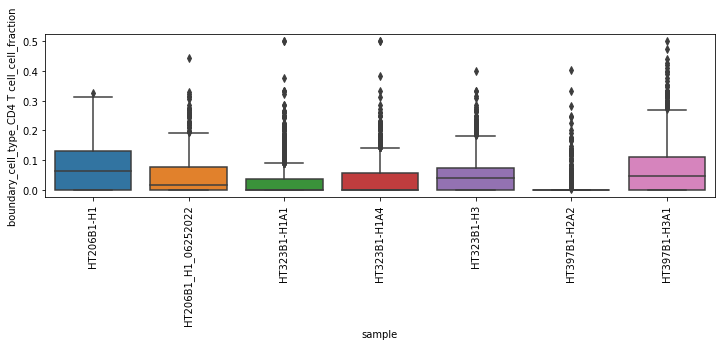

In [142]:
fig, axs = plt.subplots(figsize=(12, 3))
sns.boxplot(data=combined, x='sample', y='boundary_cell_type_CD4 T cell_cell_fraction')
plt.xticks(rotation=90)

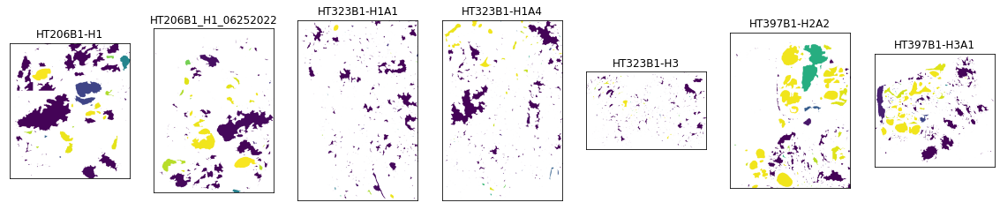

In [140]:
show_regions(combined, 'prob_dcis')

In [138]:
list(combined.columns)

['boundary_area',
 'boundary_bbox-0',
 'boundary_bbox-1',
 'boundary_bbox-2',
 'boundary_bbox-3',
 'boundary_cell_type_CD4 T cell_cell_fraction',
 'boundary_cell_type_CD8 T cell_cell_fraction',
 'boundary_cell_type_Endothelial_cell_fraction',
 'boundary_cell_type_Fibroblast_cell_fraction',
 'boundary_cell_type_Macrophage - M1_cell_fraction',
 'boundary_cell_type_Macrophage - M2_cell_fraction',
 'boundary_cell_type_Myoepithelial_cell_fraction',
 'boundary_cell_type_Noise_cell_fraction',
 'boundary_cell_type_Tumor_cell_fraction',
 'boundary_centroid-0',
 'boundary_centroid-1',
 'boundary_compactness',
 'boundary_eccentricity',
 'boundary_extent',
 'boundary_intensity_overlap_E-cadherin_Ki67',
 'boundary_intensity_overlap_E-cadherin_MGP',
 'boundary_intensity_overlap_E-cadherin_Pan-CK',
 'boundary_intensity_overlap_E-cadherin_Podoplanin',
 'boundary_intensity_overlap_E-cadherin_SMA',
 'boundary_intensity_overlap_Ki67_MGP',
 'boundary_intensity_overlap_Ki67_Pan-CK',
 'boundary_intensity_ov